#**Lab 01 - House Price Prediction using Python**


---



######**Submitted by:**
######Name : Nilanjana Dey
######Register No. : 23122024
######Class : 3-Msc-DS-A


---

##1.Lab Overview

###Objective :
Use the California Housing dataset to perform exploratory data analysis and predict housing prices using a Linear Regression model from the sklearn library. Investigate how various hyperparameters affect the model's performance.
Dataset Description
The California Housing dataset includes metrics such as the median income, housing median age, average room numbers, average bedroom numbers, population, average occupancy, latitude, and longitude of a block group in California.

###Problem Approach :
Indications on how you may approach the problem is described below.
Please note that this is only a guideline, and you are expected to explore the possibilities on your own.
Provide a detailed report covering all the tasks, your observations. You are encouraged to formulate certain EDA questions and answer the same during the submission. For instance, "Which features have highest correlation?" or "Is there any prominent feature affecting the house price?" etc.
The final submission must include a neatly formatted Jupyter Notebook File, HTML and PDF Exports of the lab.

###A. Data Exploration and Preprocessing
####**Preliminary Analysis:**

Display the first few rows of the dataset.
Describe the dataset to understand the range and distribution of each feature.
Visualization:
Create histograms for each numerical feature to understand the distribution.
Plot the geographical data (latitude and longitude) using a scatter plot, coloring the points by the median house value to visualize the price distribution across regions.

####**Data Cleaning**
Check for missing values and handle them appropriately.
Consider normalizing or standardizing the data if necessary.

###B. Model Building:
1)Feature Selection: Identify which features are most relevant for predicting housing prices.

2)Data Splitting: Split the dataset into training and testing sets.

###C. Linear Regression Model:

1) Model Fitting: Fit a Linear Regression model to the training data.

2) Prediction: Make predictions on the test set.

###D. Hyperparameter Tuning and Model Evaluation
Explore at least two hyperparameters in the Linear Regression model.
For instance, experiment with different settings of fit_intercept and normalize.

For each hyperparameter setting, fit the model to the training data and evaluate its performance on the test set, based on the evaluation metrics that are given below.

###E. Evaluation Metrics:
Calculate and compare the Root Mean Square Error (RMSE) and
R² Score for each model configuration.
Discuss how each hyperparameter setting impacts the model performance.
Select one of the configurations, and plot the predicted line.
Add the scatter value of y_test values to the plot.
Write a small interpretation on how well the line fits the set of points that are present in the testing dataset.

## 2. SECTIONS

1. Data Exploration and Preprocessing
2. Model Building
3. Linear Regression Model
4. Hyperparamter Tuning and Model Evaluation
5. Evaulation Metrices




##References :
Linear Regression Library Usage:

 https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

https://github.com/kamalakarpeta/predictive_analysis_with_linear_regression/blob/master/california_predictive_analysis_with_linear_regression.ipynb

https://lectures.scientific-python.org/packages/scikit-learn/auto_examples/plot_california_prediction.html

https://inria.github.io/scikit-learn-mooc/python_scripts/datasets_california_housing.html

https://www.kaggle.com/code/esotariq/california-housing-tutorial

All Kaggle Codes related to this: https://www.kaggle.com/datasets/camnugent/california-housing-prices/code



---











---


##**DATA EXPLORATION AND PREPROCESSING**

###Theoritical Background:
####Data exploration involves analyzing and visualizing datasets to gain insights into their characteristics, distributions, and relationships between variables. It includes summary statistics, data visualization, and identifying patterns or anomalies. Preprocessing prepares data for analysis by cleaning, transforming, and encoding features. Tasks include handling missing values, outlier detection, feature scaling, and encoding categorical variables. Effective exploration and preprocessing ensure data quality, improve model performance, and aid in understanding the underlying structure of the data, facilitating better decision-making in subsequent analysis and modeling processes.

### a) Preliminary Analysis :

1.   Importing Libraries
2.   Loading the csv file
3.   Viewing the first 10 rows in the dataset
4.   Viewing the last 10 rows of the dataset
5.   Information about each column
6.   Descriptive Analysis of the numerical columns
7.   Checking the Presence of missing observations
8.   Visualization of missing values using a heatmap
9.   Plotting the distribution of each column.
10.  Checking whether the numerical columns follow normal distribution
11.  Checking the correlation of any features using scatterplot
12.  Checking the no. of unique values for categorical column
13.  Plotting the frequency plot of the categorical column


### b) Data Cleaning :



1.   Imputing the missing values
2.   Encoding the categorical column
3.   Scaling the numerical columns
4.   Plotting every numerical column after scaling
5.   Plotting the boxplot for checking the outliers
6.   Using box-cox transformation to those columns which are right-skewed to convert them into normal distribution
7.   Trimming the outlier values to a particular threshold value


### c) Visualization After Cleaning:

1.  Plotting boxplots to check the situation of outliers
2.  Checking the correlation between variables through pairplots
3. Getting the correlation heat map to check the magnitude of correlation between every pair of variables

###**__ OBSERVATIONS__**

a) Preliminary Analysis :

*   There is only one categorical column -> "ocean_proximity"
*   The "total_bedrooms" columns has 207 missing values.
*   The heatmap for missing values for the above column does follow a pattern

*   The histogram of every column shows that the data is positively skewed.
*   The Q-Q plot shows that the some column somewhat fits into normal distribution.

*  The pairplot shows the correlation between certain variables.
*  There are 5 unique values in the catgorical column.
*  We see that the factor-"<1H OCEAN" is the most frequently occuring categorical value.
*  We use boxplots to view the outliers. Every column has a significant no. of outliers which needs to be removed.

b) Data Cleaning :                     



*   The missing values in the "total_bedrooms" is imputed with the median values from the dataset.
*   The observations in the categorical column is encoded with values -> 0,1,2,3,etc.
*  The columns are standardized so that the scale of each column is same and distribution is proper.
*  Some numerical columns are normalized using box-cox transformation so that the outliers can be trimmed to a certain threshold value.

c) Visualization After Cleaning :         

*  The latitude vs longitude graph shows the spread of houses with respect to the house prices.




---







In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_california_housing
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from scipy import stats
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, explained_variance_score
from sklearn.model_selection import cross_val_score
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from sklearn.metrics import  mean_squared_log_error



ModuleNotFoundError: No module named 'statsmodels'

In [99]:
df=pd.read_csv("housing.csv")

In [100]:
df.head(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


In [101]:
df.tail(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20630,-121.32,39.29,11.0,2640.0,505.0,1257.0,445.0,3.5673,112000.0,INLAND
20631,-121.40,39.33,15.0,2655.0,493.0,1200.0,432.0,3.5179,107200.0,INLAND
20632,-121.45,39.26,15.0,2319.0,416.0,1047.0,385.0,3.1250,115600.0,INLAND
20633,-121.53,39.19,27.0,2080.0,412.0,1082.0,382.0,2.5495,98300.0,INLAND
20634,-121.56,39.27,28.0,2332.0,395.0,1041.0,344.0,3.7125,116800.0,INLAND
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [102]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [103]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [104]:
print(df.isnull().sum())

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64


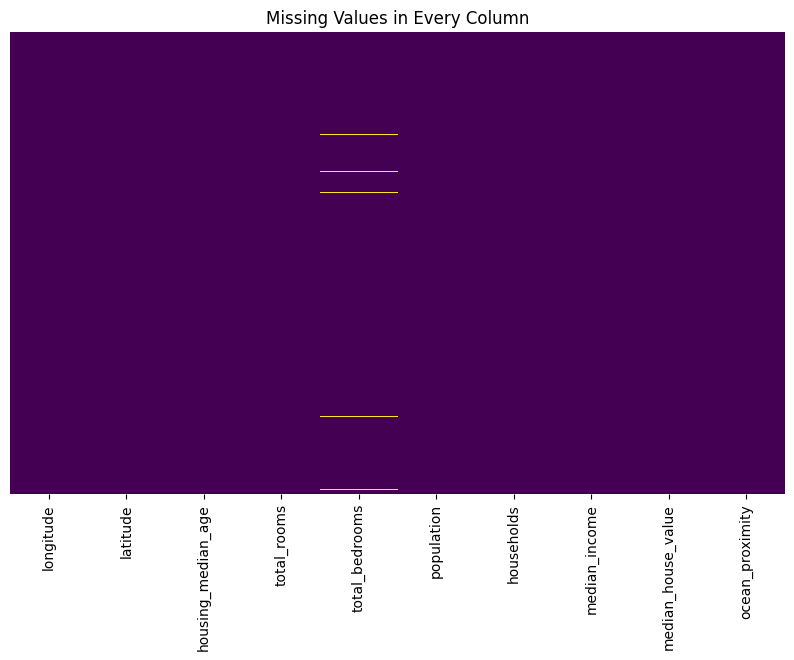

In [105]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Missing Values in Every Column')
plt.show()

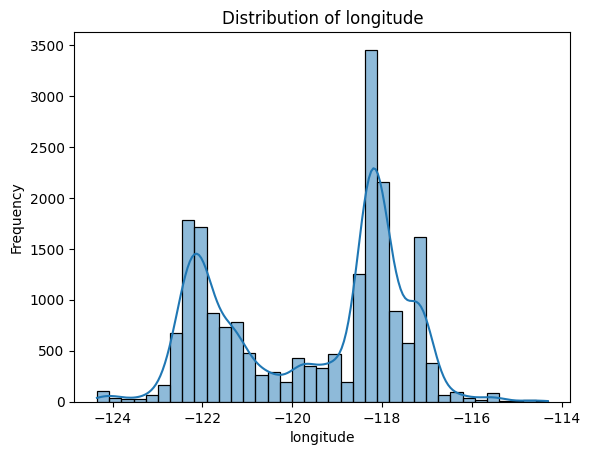

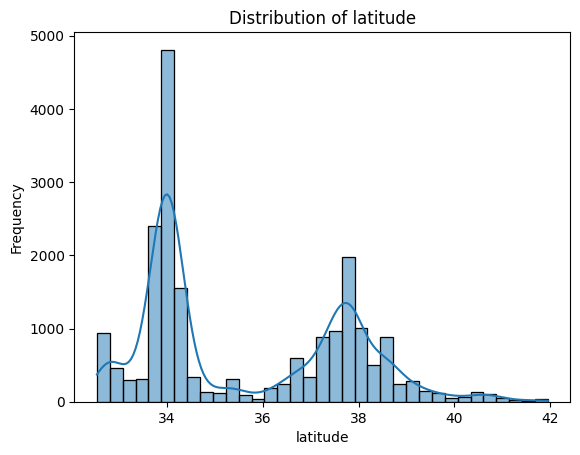

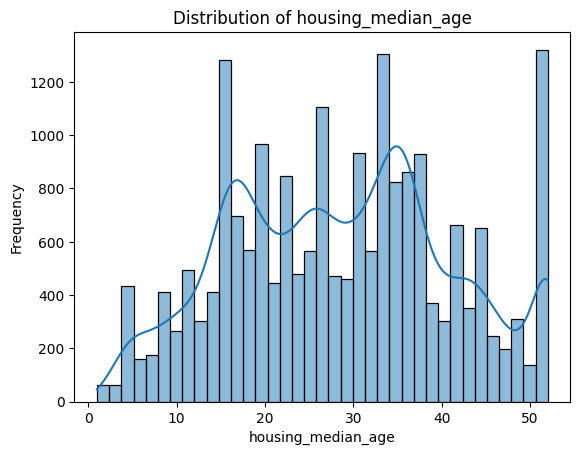

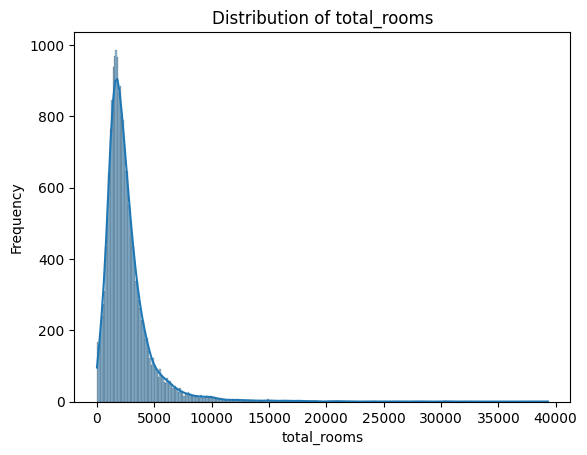

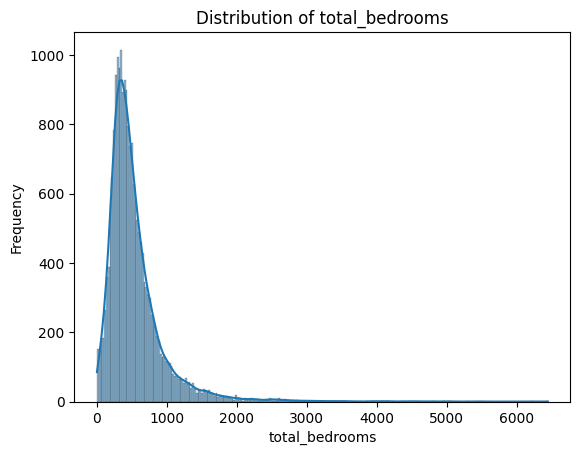

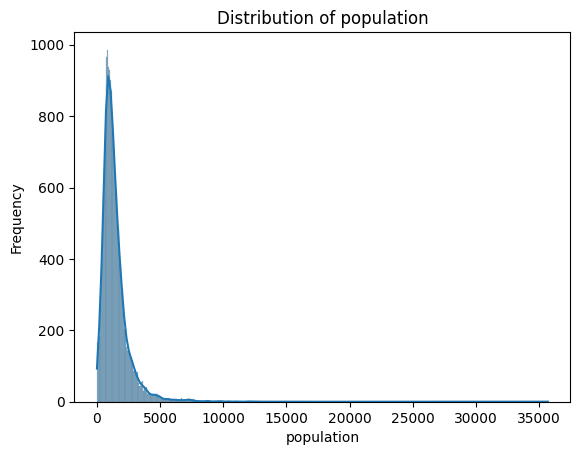

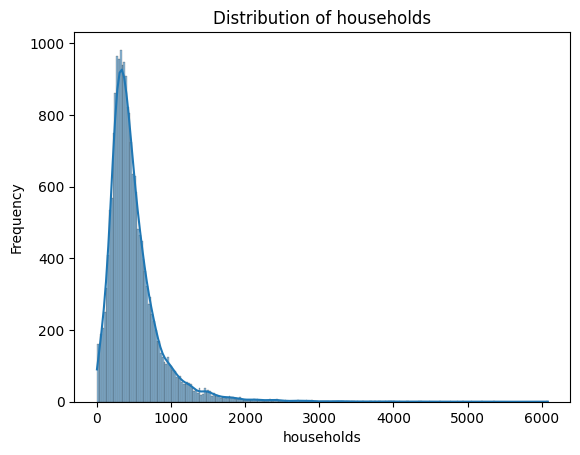

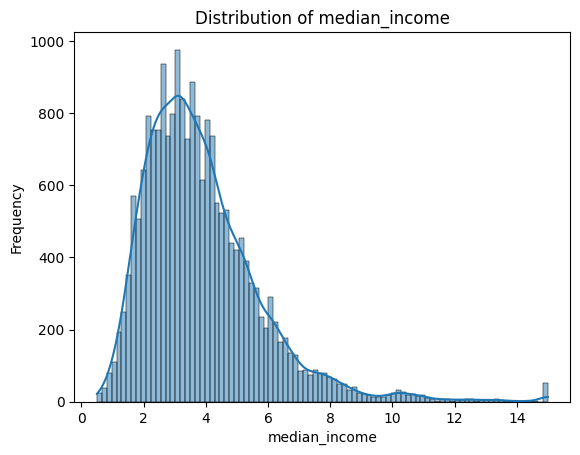

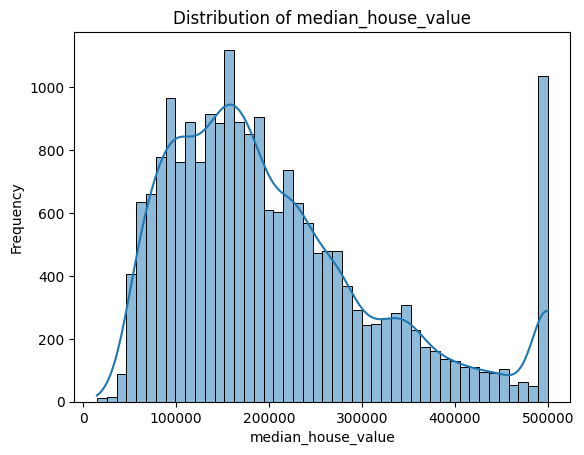

In [106]:
for column in df.select_dtypes(include=['float64']).columns:
    sns.histplot(df[column], kde=True)  # Use kde=True to include kernel density estimation
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

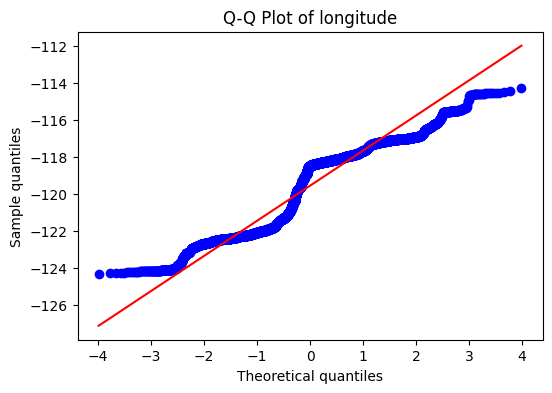

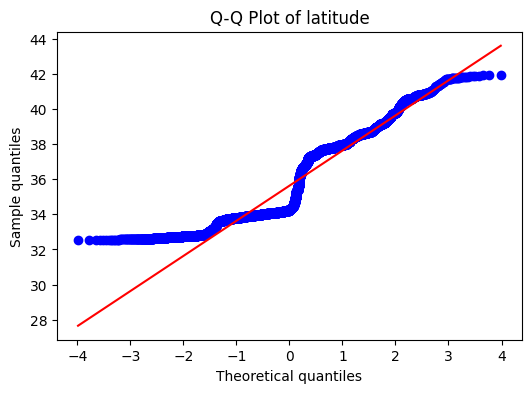

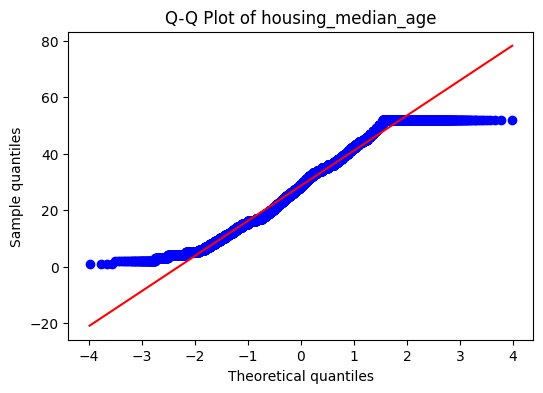

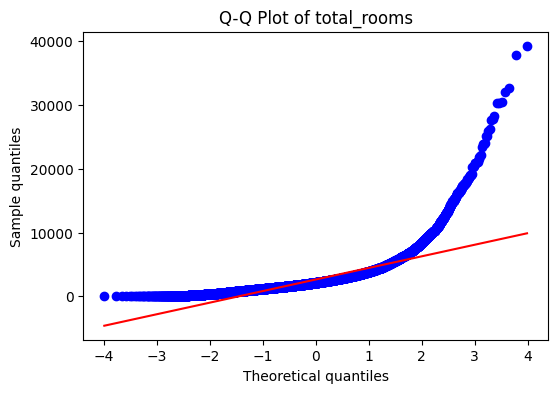

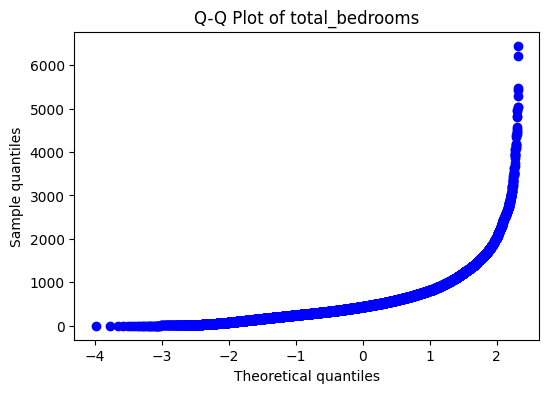

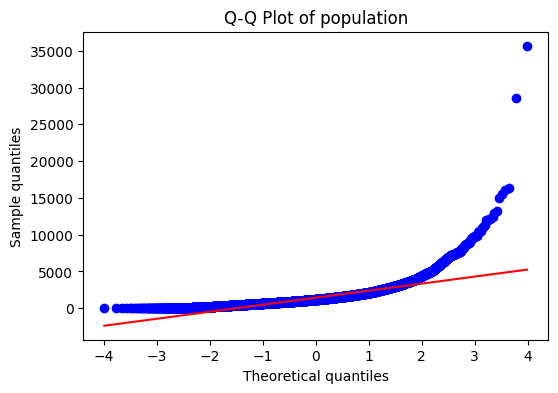

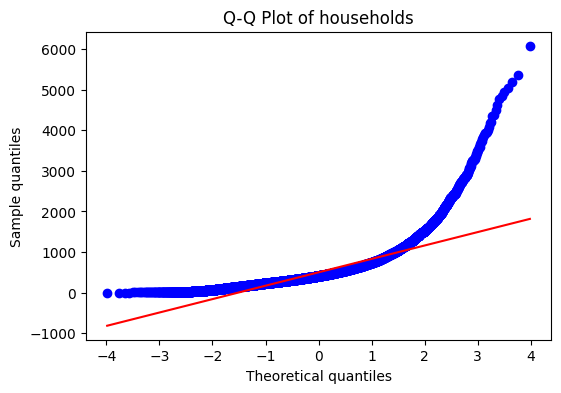

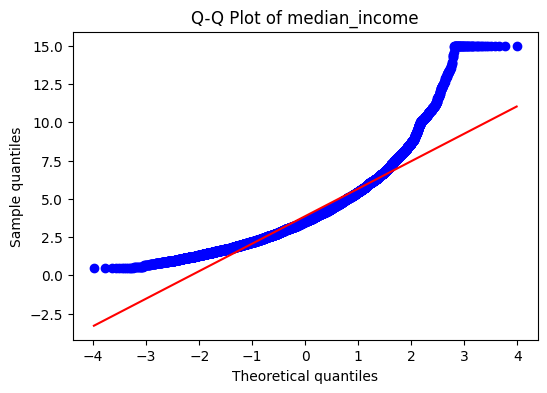

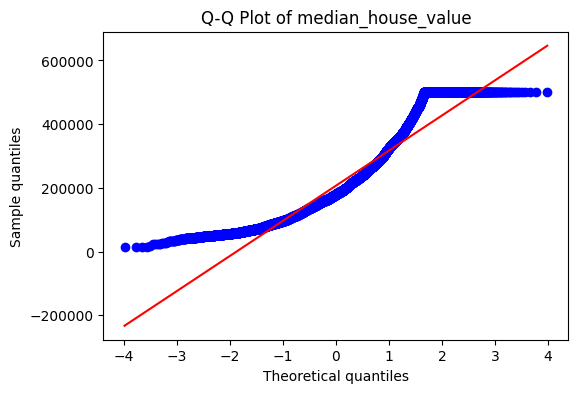

In [107]:
# Iterate over each numerical column and create a Q-Q plot
for column in df.select_dtypes(include=['int', 'float']).columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column}')
    plt.xlabel('Theoretical quantiles')
    plt.ylabel('Sample quantiles')
    plt.show()

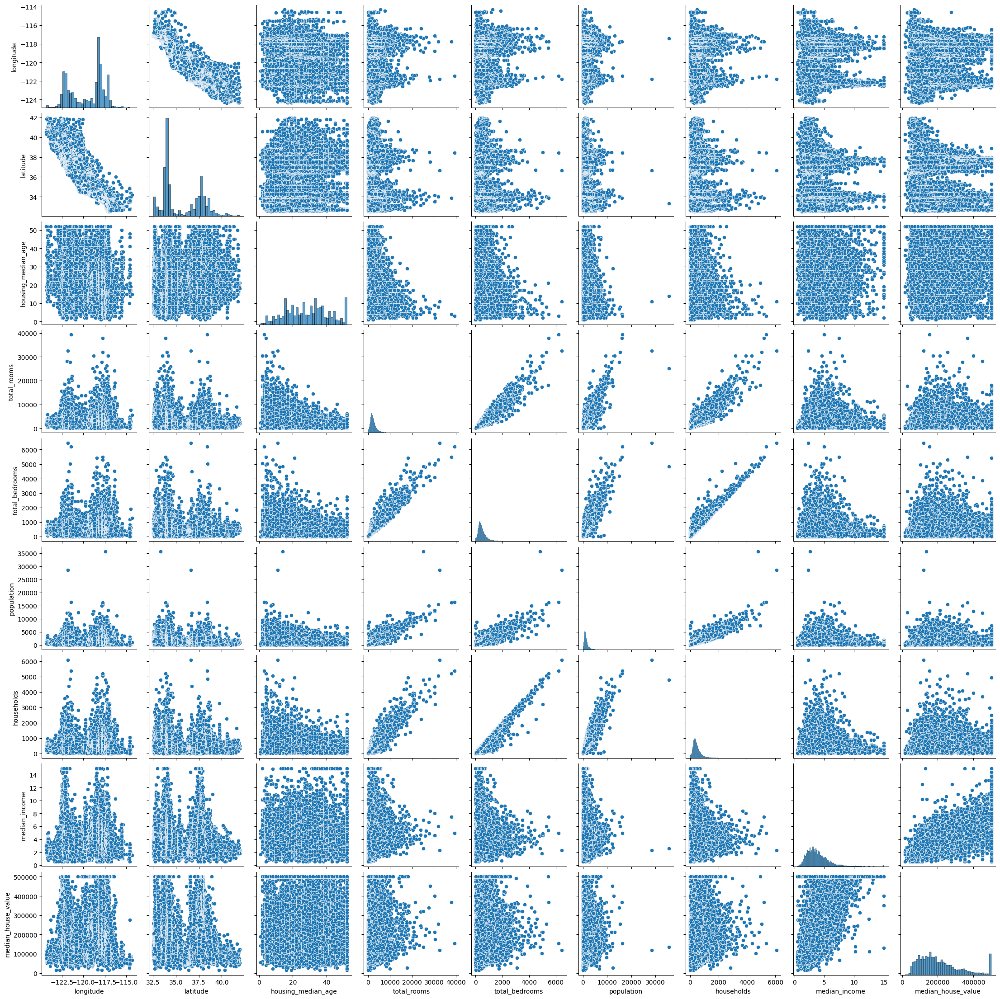

In [108]:
# Create a pairplot of all features
sns.pairplot(df)
plt.show()

In [109]:
unique_values_count = df['ocean_proximity'].nunique()

print("Number of unique values in the 'ocean proximity' column:", unique_values_count)

Number of unique values in the 'ocean proximity' column: 5


<ipython-input-110-8d73b8ca0525>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='ocean_proximity', data=df,palette=['#33FF57','#FF5733','yellow','blue','#337AFF'])


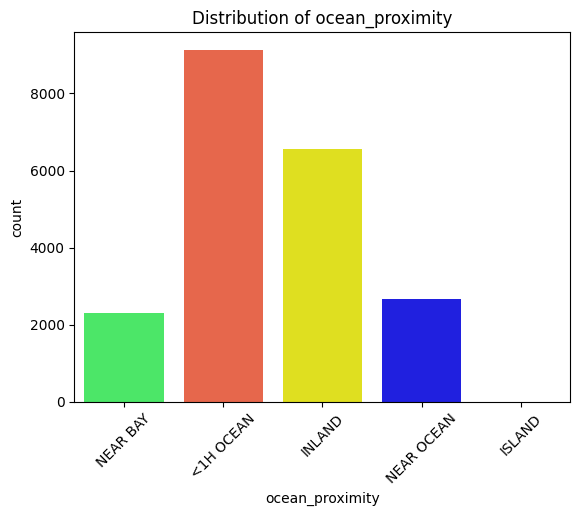

In [110]:
# Replace 'categorical_column' with the name of your categorical column
sns.countplot(x='ocean_proximity', data=df,palette=['#33FF57','#FF5733','yellow','blue','#337AFF'])
plt.title('Distribution of ocean_proximity')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.show()

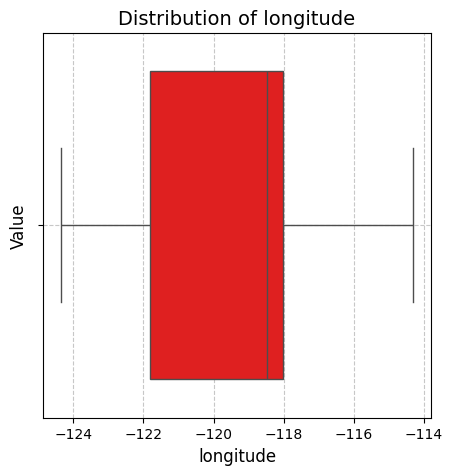

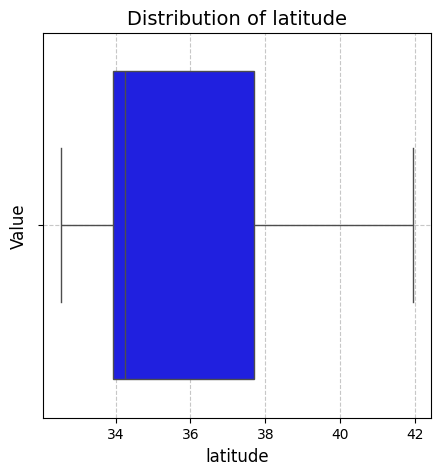

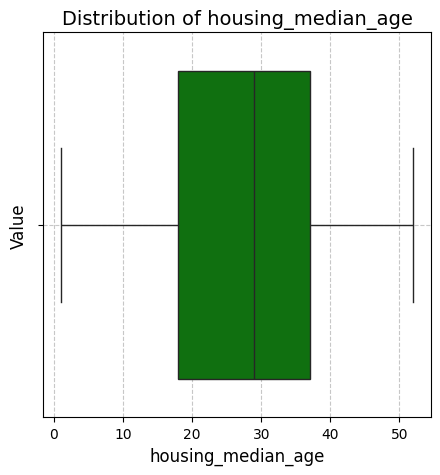

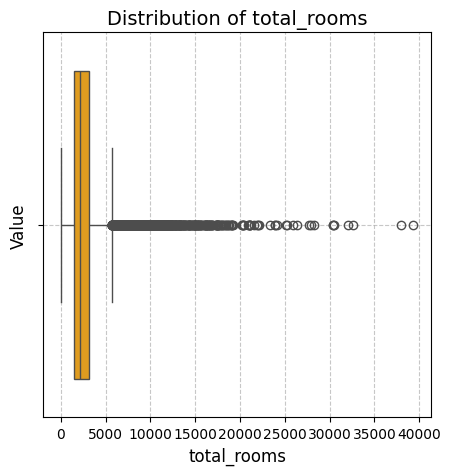

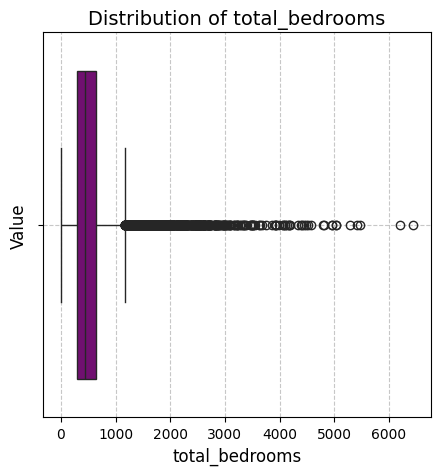

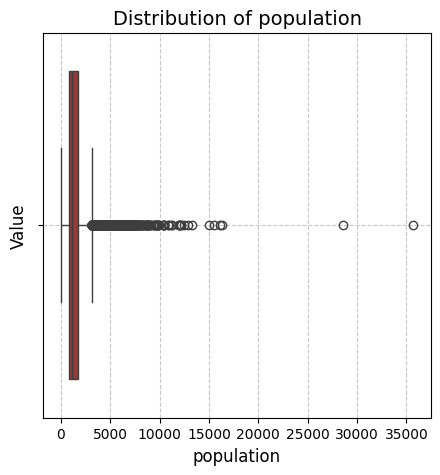

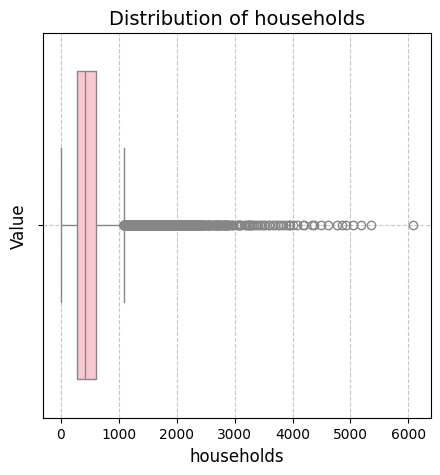

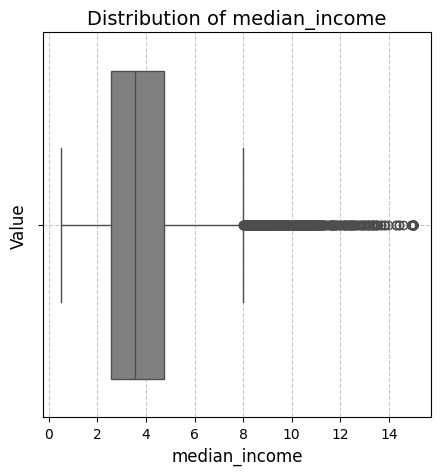

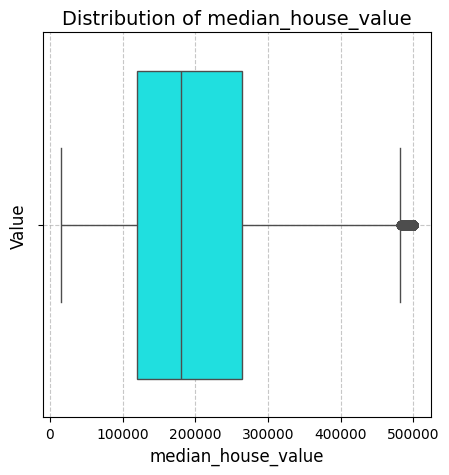

In [111]:
# Define a list of colors to use for each graph
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'cyan', 'magenta']

# Iterate over each numerical column and create a boxplot with a different color
for i, column in enumerate(df.select_dtypes(include=['int', 'float']).columns):
    plt.figure(figsize=(5,5))
    sns.boxplot(x=df[column], color=colors[i % len(colors)])  # Cycling through the list of colors
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

In [112]:
# Replace 'numerical_column' with the name of your numerical column
numerical_column = 'total_bedrooms'

# Create an instance of SimpleImputer with strategy='mean' (you can use 'median' or 'most_frequent' as well)
imputer = SimpleImputer(strategy='median')

# Reshape the numerical column for imputation (required for sklearn's imputer)
# This step converts the column into a 2D array
imputer.fit(df[numerical_column].values.reshape(-1, 1))

# Perform imputation
df[numerical_column] = imputer.transform(df[numerical_column].values.reshape(-1, 1))

# Check if there are any remaining missing values in the column
if df[numerical_column].isnull().any():
    print("Warning: There are still missing values after imputation.")



In [113]:
df.to_csv('imputed_dataset.csv', index=False)
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [114]:
# Extract the categorical input column you want to encode
input_column = df['ocean_proximity']

# Initialize the LabelEncoder
encoder = LabelEncoder()

# Fit and transform the input column
encoded_column = encoder.fit_transform(input_column)

# Replace the original column with the encoded column in the DataFrame
df['ocean_proximity'] = encoded_column

df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,3
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,3
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,3
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,3
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,1
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,1
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,1
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,1


In [115]:
# Extract column names into an array
column_names = df.columns.values

# Print the array of column names
print(column_names)

['longitude' 'latitude' 'housing_median_age' 'total_rooms'
 'total_bedrooms' 'population' 'households' 'median_income'
 'median_house_value' 'ocean_proximity']


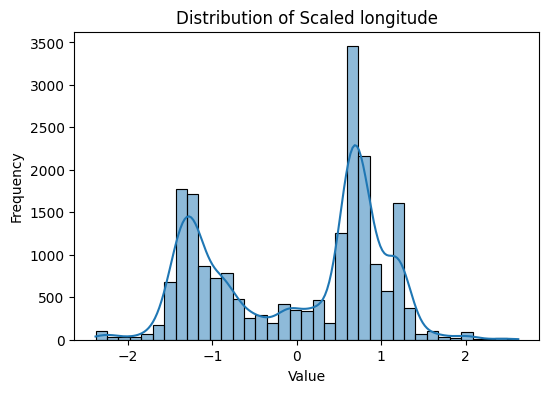

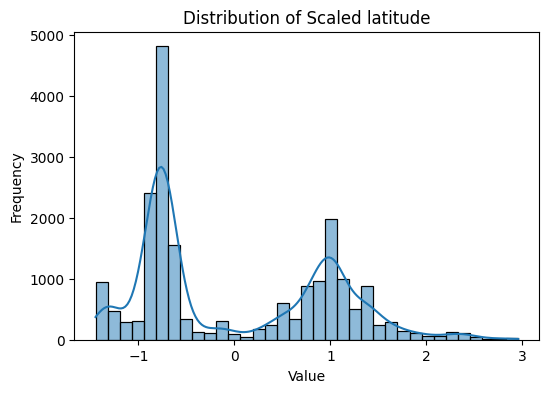

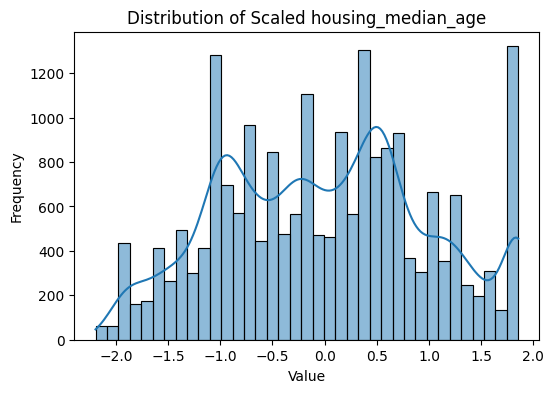

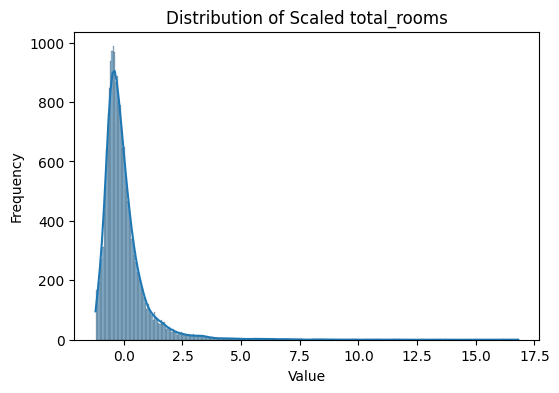

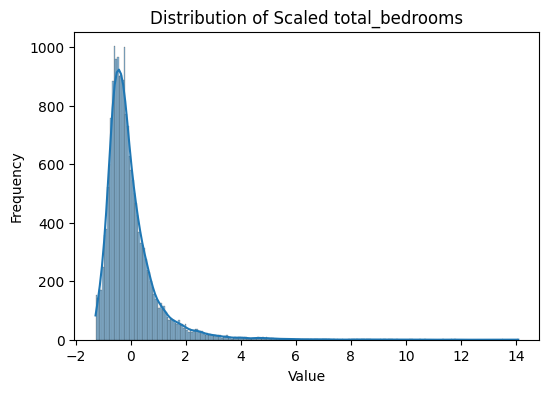

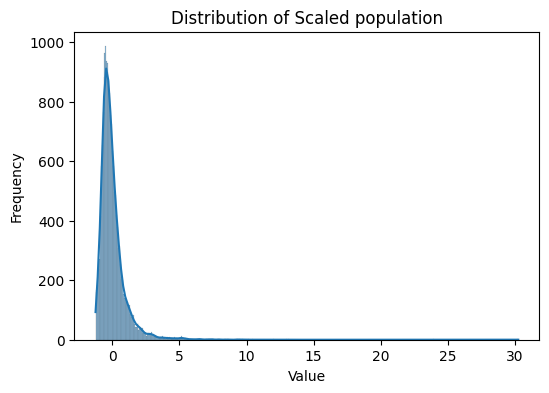

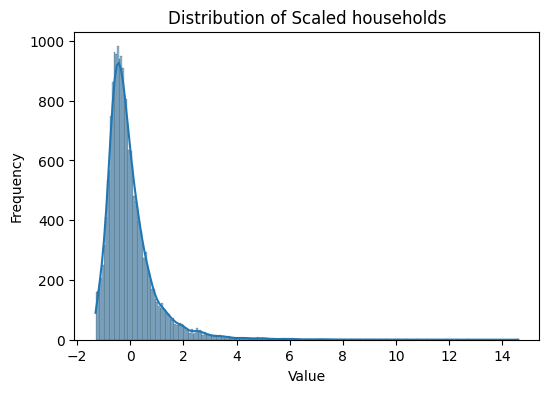

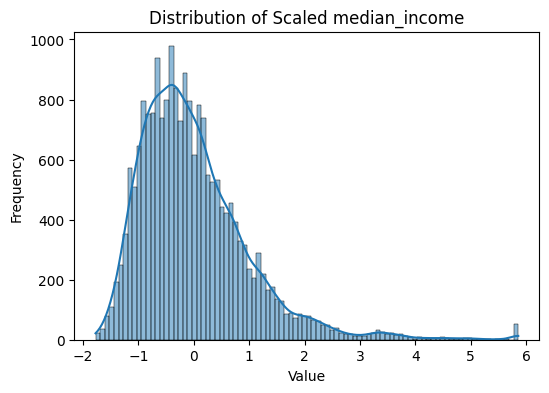

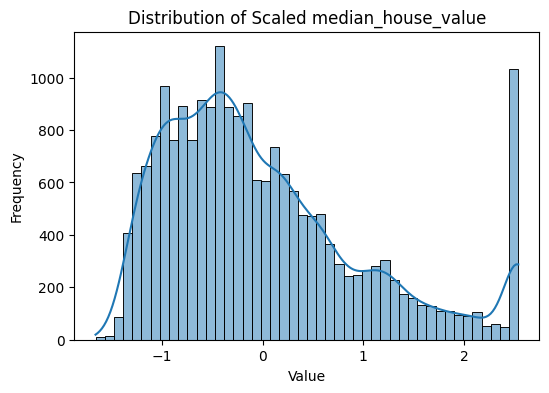

In [116]:
# Initialize the StandardScaler
scaler = StandardScaler()

columns_for_scaling=['longitude','latitude','housing_median_age','total_rooms','total_bedrooms','population','households','median_income','median_house_value']
# Fit and transform the independent columns
df[columns_for_scaling] = scaler.fit_transform(df[columns_for_scaling])

# Plot histograms for each scaled column
for column in columns_for_scaling:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of Scaled {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()

In [117]:
columns_for_transformation=['longitude','latitude','housing_median_age','total_rooms','total_bedrooms','population','households','median_income','median_house_value']

for column in df.select_dtypes(include=['int', 'float']).columns:
    # Box-Cox transformation requires positive values, so we shift the data if necessary
    min_value = df[column].min()
    if min_value <= 0:
        df[column] = df[column] - min_value + 1

    # Apply Box-Cox transformation
    df[column], _ = stats.boxcox(df[column])

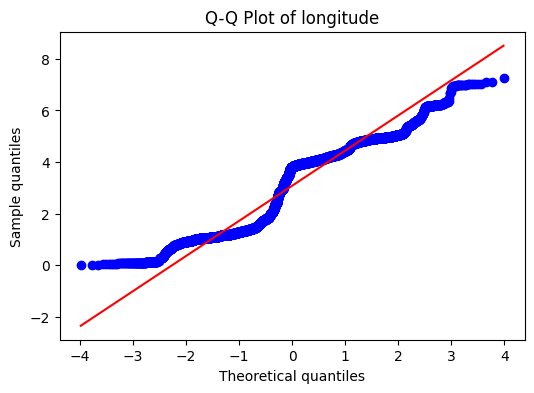

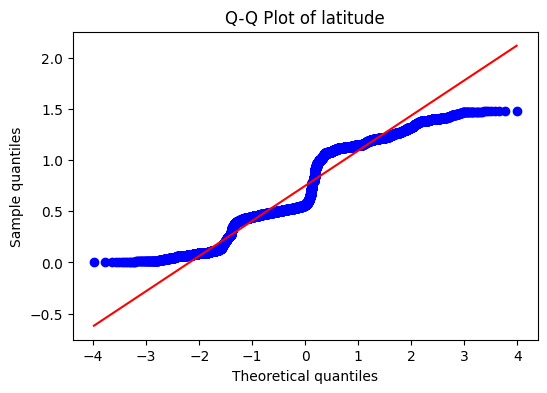

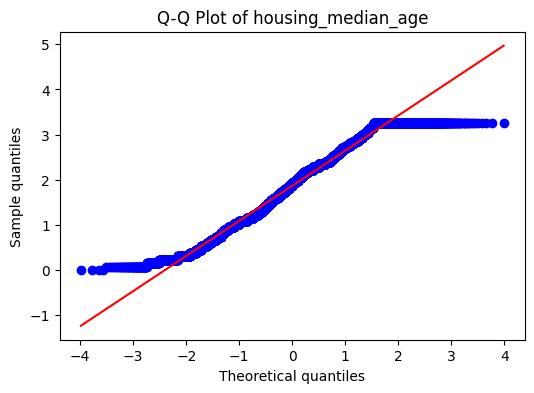

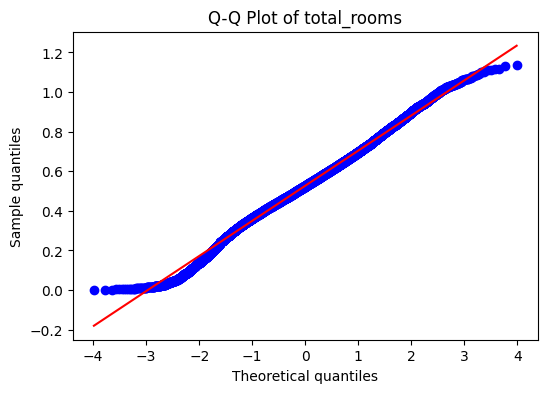

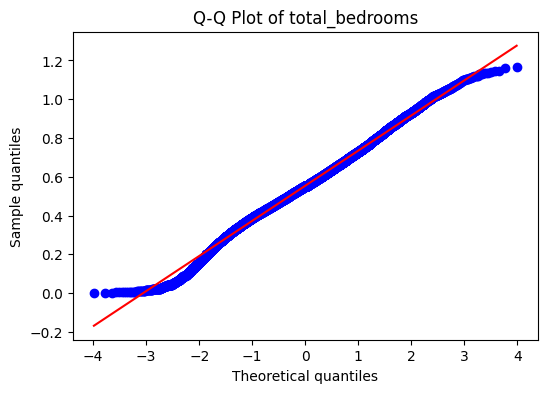

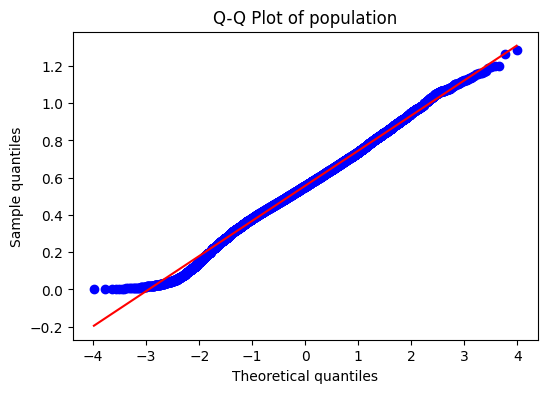

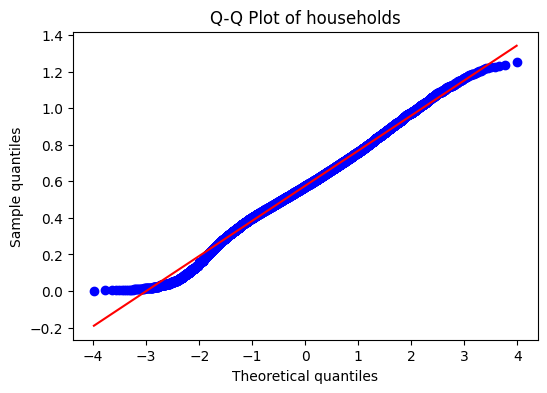

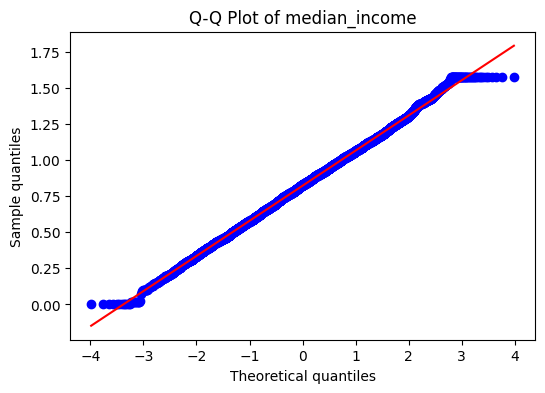

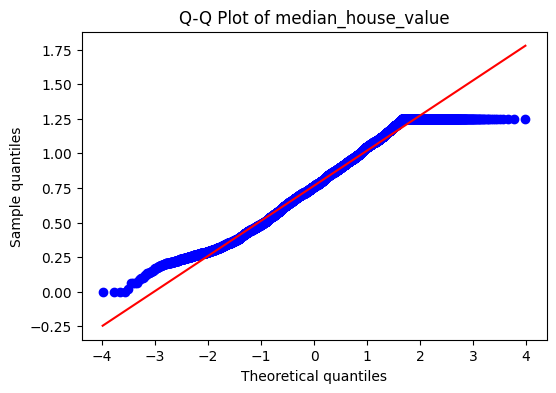

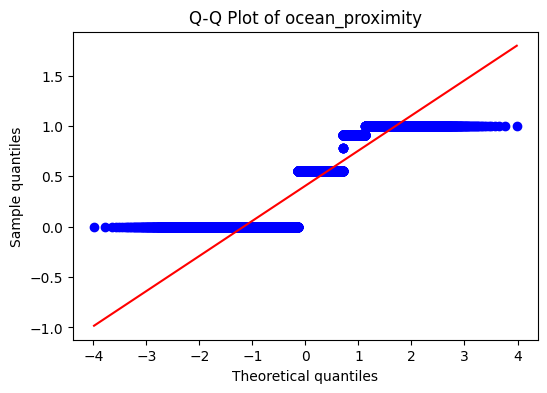

In [118]:
# Iterate over each numerical column and create a Q-Q plot


for column in df.select_dtypes(include=['int', 'float']).columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column}')
    plt.xlabel('Theoretical quantiles')
    plt.ylabel('Sample quantiles')
    plt.show()

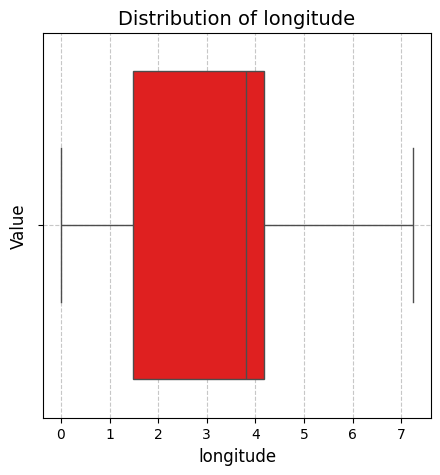

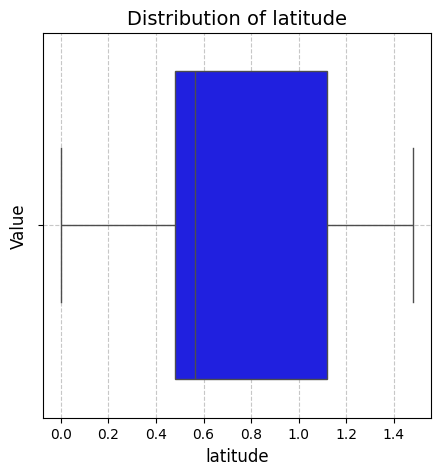

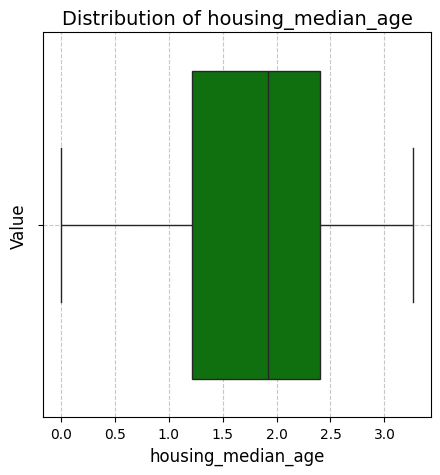

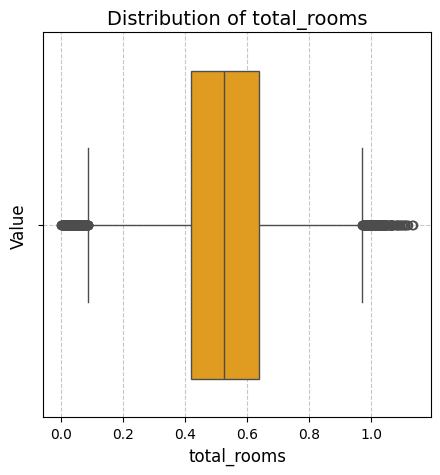

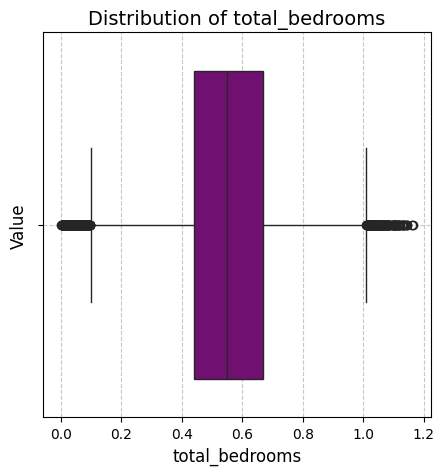

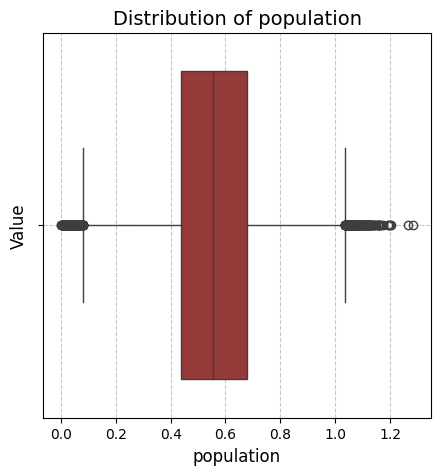

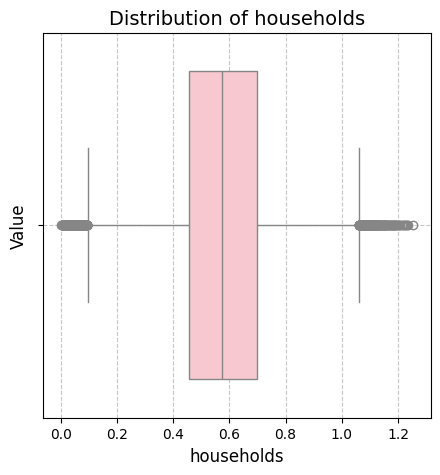

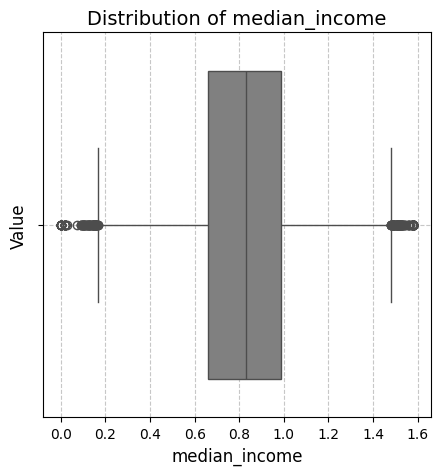

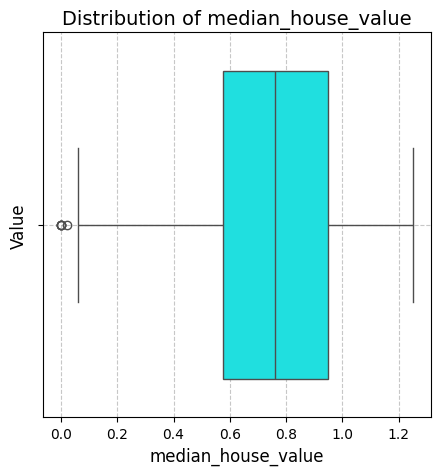

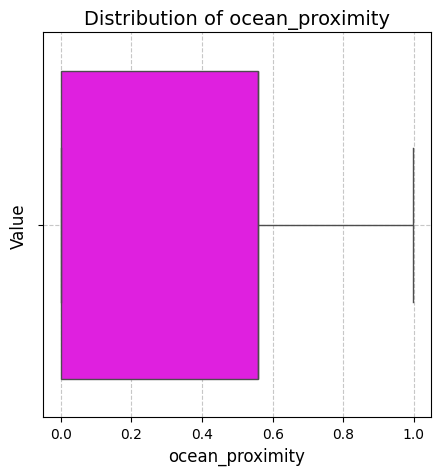

In [119]:
# Define a list of colors to use for each graph
colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'cyan', 'magenta']

# Iterate over each numerical column and create a boxplot with a different color
for i, column in enumerate(df.select_dtypes(include=['int', 'float']).columns):
    plt.figure(figsize=(5,5))
    sns.boxplot(x=df[column], color=colors[i % len(colors)])  # Cycling through the list of colors
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

In [120]:
# Compute Z-scores for each column
columns_to_treat=['longitude','latitude','housing_median_age','total_rooms','total_bedrooms','population','households','median_income','median_house_value','ocean_proximity']

data=df[columns_to_treat]
z_scores = np.abs(stats.zscore(data))

# Set a threshold for identifying outliers (e.g., Z-score > 3)
threshold = 3

# Clip outliers to a specific threshold value
data = np.clip(data, a_min=None, a_max=threshold)



In [121]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,1.202229,1.137118,2.638196,0.296462,0.241323,0.227448,0.257298,1.286165,1.204341,0.913768
1,1.208478,1.134917,1.413669,0.858765,0.825079,0.778830,0.894501,1.284675,1.093308,0.913768
2,1.195984,1.133815,3.000000,0.421533,0.324403,0.318565,0.333777,1.214218,1.084649,0.913768
3,1.189743,1.133815,3.000000,0.384637,0.376885,0.347107,0.388454,1.080106,1.069654,0.913768
4,1.189743,1.133815,3.000000,0.449560,0.423387,0.350217,0.434864,0.873455,1.070922,0.913768


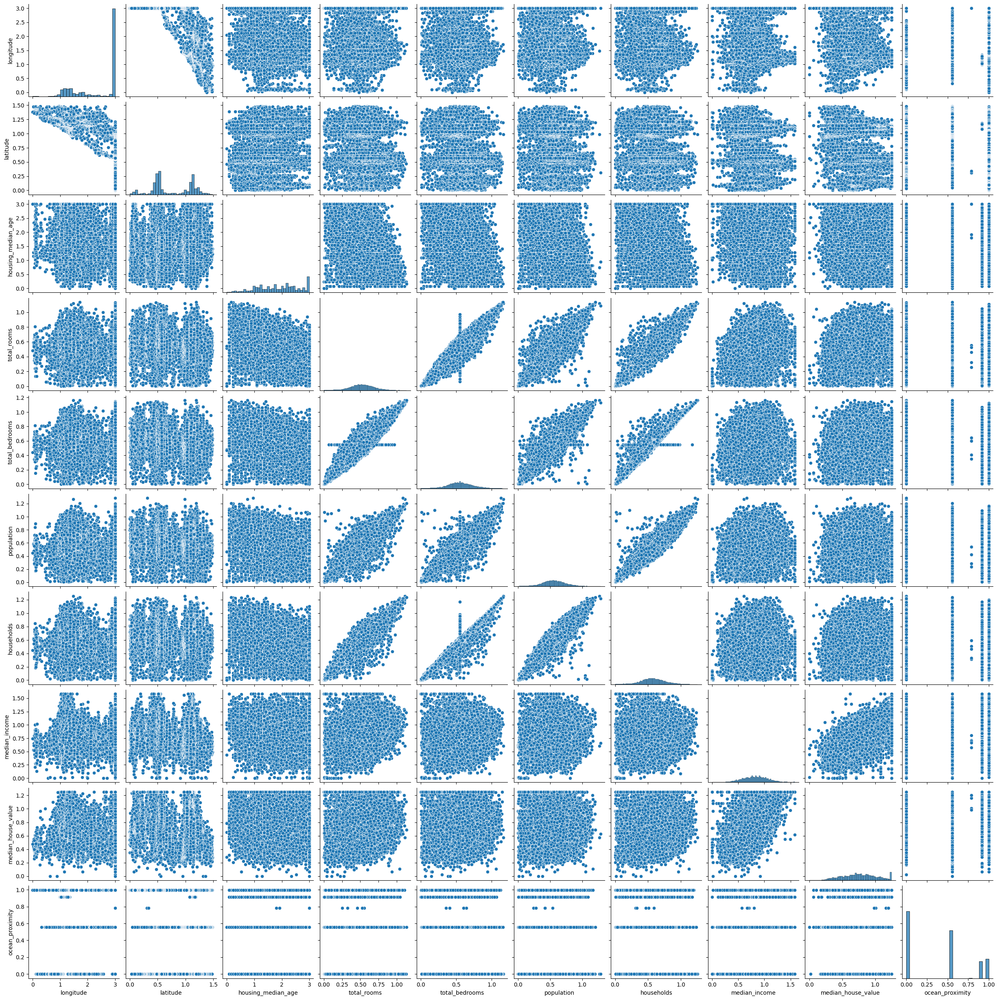

In [122]:
# Create a pairplot of all features
sns.pairplot(data)
plt.show()

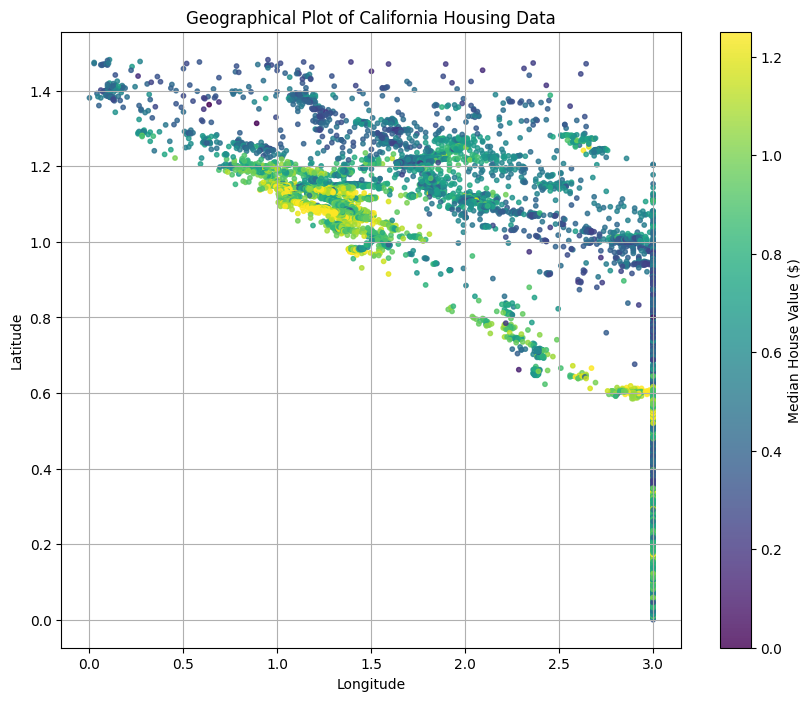

In [123]:

# Plot the geographical data
plt.figure(figsize=(10, 8))
scatter = plt.scatter(data['longitude'], data['latitude'], c=data['median_house_value'], cmap='viridis', s=10, alpha=0.8)
plt.colorbar(scatter, label='Median House Value ($)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographical Plot of California Housing Data')
plt.grid(True)
plt.show()

<ipython-input-124-1ef6e4670e34>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=data['ocean_proximity'], y=data['median_house_value'], palette='Pastel1')


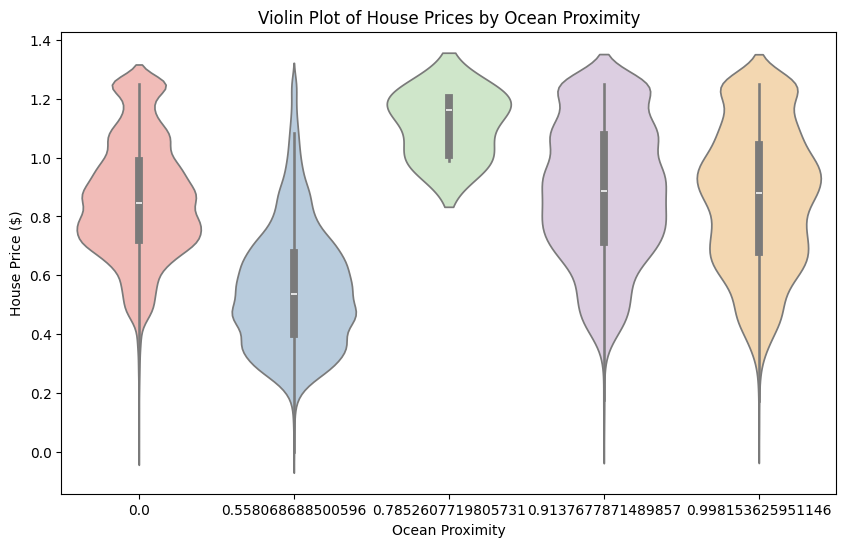

In [124]:
plt.figure(figsize=(10, 6))
sns.violinplot(x=data['ocean_proximity'], y=data['median_house_value'], palette='Pastel1')
plt.xlabel('Ocean Proximity')
plt.ylabel('House Price ($)')
plt.title('Violin Plot of House Prices by Ocean Proximity')
plt.show()

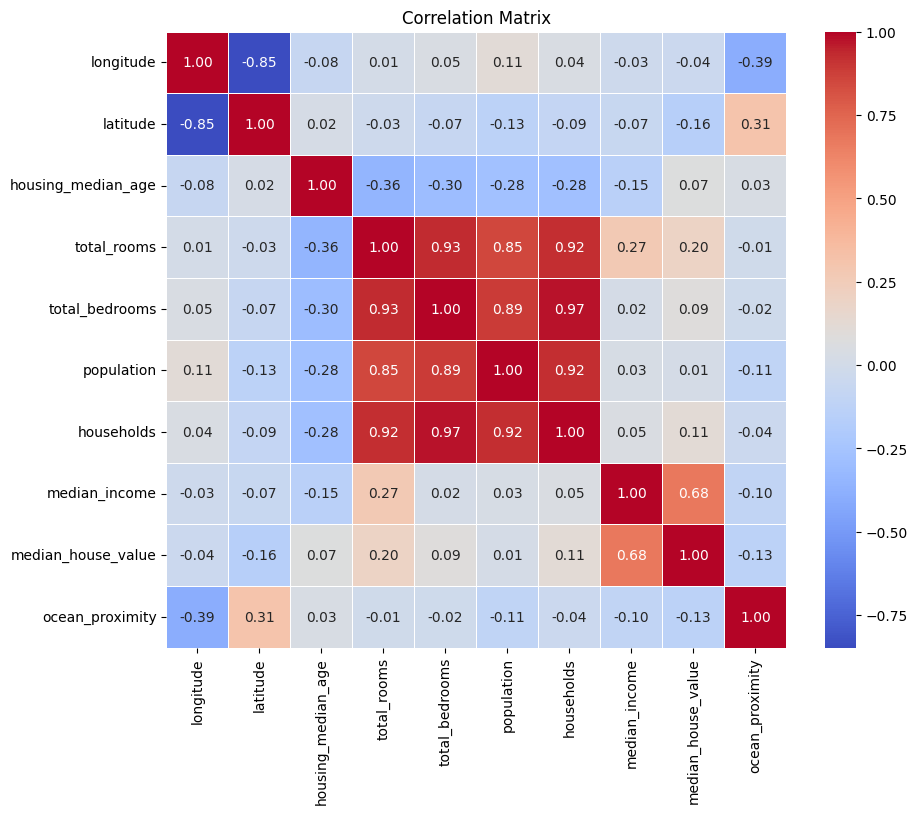

In [125]:
# Calculate the correlation matrix
correlation_matrix = data.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()



---


##**MODEL BUILDING**

###Theoritical Background:

Model building is the process of constructing predictive or descriptive models from data. It involves selecting appropriate algorithms, training the model on labeled data, optimizing parameters, and evaluating performance using validation techniques. The goal is to create models that accurately capture relationships in the data and generalize well to unseen examples.

Here we are going to fit a Linear Regression model to the given dataset in order to predict the house prices.

Therefore, we need to keep in mind the assumptions of a linear regression model which are the following:-


*   **Linearity**: The relationship between the independent and dependent variables is linear.

*   **Independence**: Observations are independent of each other.

*   **Homoscedasticity**: Residuals have constant variance across all levels of the independent variables.

*   **Normality**: Residuals are normally distributed.

*   **No perfect multicollinearity**: Independent variables are not perfectly correlated with each other.
*   **No influential outliers**: Outliers do not unduly influence the regression results.

###a) Feature Selection:


1.   Fixing the target variable and the independant variables
2.   Checking which independant variable forms a linear relationship with the target column.
3.   If the no. of features selected is 1, then no need of checking multicollinearity.
4. Since, the outliers are already taken care of,no need of outlier removal.


###b)  Splitting the dataset into train and test data.
     
#####***Note*** :
##### Training dataset : The model learns patterns and relationships from the train data, adjusting its internal parameters to minimize errors.

##### Testing dataset : The test dataset contains examples that the model hasn't seen during training, allowing you to assess how well the model generalizes to new, unseen data.



###**__ OBSERVATIONS__**


*   The dependant variable is definitely - "median_house_value" because we want to predict these prices using the other factors.
*   I have selected only one independant variable,i.e, "median_total_income" since the above correlation matrix and the pairplot shows minimum correlation between any other variable. Also, certain features have multicollinearity which will hamper the fittng of the model.
*   The entire dataset will be splitted into 80-20% ratio called as training set and test set.






---



   





In [126]:

# Separate the target variable from the features
X=data['median_income']
y=data['median_house_value']
# Reshape the target vector to a column vector
y = y.values.reshape(-1, 1)
X = X.values.reshape(-1, 1)


# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (16512, 1) (16512, 1)
Testing set shape: (4128, 1) (4128, 1)




---


##**LINEAR REGRESSION MODEL**

###Theoritical Background :
Linear regression predicts the relationship between two variables by assuming a linear connection between the independent and dependent variables. It seeks the optimal line that minimizes the sum of squared differences between predicted and actual values.

To calculate best-fit line linear regression uses a traditional slope-intercept form which is given below,

Yi = β0 + β1Xi

where

Yi = Dependent variable,  

β0 = constant/Intercept,

β1 = Slope/Intercept,

Xi = Independent variable.

This algorithm explains the linear relationship between the dependent(output) variable y and the independent(predictor) variable X using a straight line  Y= B0 + B1 X.


1.   **Model Fitting** : Fit a Linear Regression model to the training data.
2.   **Prediction** : Make predictions on the test set.


###**__ OBSERVATIONS__**



*   We fit the simple linear regression model where the independant variable is "median_income" and dependant variable is "median_house_value"
*   After fitting the model, we predict the values for the dependant variable using the test dataset.



---



In [127]:
# Instantiate the LinearRegression model
model1 = LinearRegression()

# Fit the model to the training data
model1.fit(X_train, y_train)

LinearRegression()

In [128]:
# Use the fitted model to make predictions
y_pred1 = model1.predict(X_test)




---


## **Hyperparameter Tuning and Model Evaluation**

###Theoritical Background

**Hyperparameter tuning** is the process of optimizing the hyperparameters of a machine learning model to improve its performance.

**Model evaluation** is the process of assessing the performance and effectiveness of a machine learning model.

*  ***Explore at least two hyperparameters in the Linear Regression model.***

  In scikit-learn, the Linear Regression model does not have many hyperparameters to tune compared to more complex models like tree-based algorithms or neural networks. However, it does have a few hyperparameters that can be adjusted:

1.  **fit_intercept**: This hyperparameter determines whether to calculate the intercept for the linear regression model. It's a boolean value (True or False). If set to True, the model will calculate the intercept, otherwise, it will assume it to be zero. Default is True.
2.  **normalize**: This hyperparameter is used to normalize the input variables. If set to True, the regressors X will be normalized before regression by subtracting the mean and dividing by the l2-norm. Default is False.
3.  **n_jobs** : This hyperparameter specifies the number of jobs to use for the computation. If set to -1, all CPUs are used. Default is None.


*   ***For each hyperparameter setting, fit the model to the training data and evaluate its performance on the test set, based on the evaluation metrics that are given below.***

1.  The **Root Mean Squared Error (RMSE)** is one of the two main performance indicators for a regression model. It measures the average difference between values predicted by a model and the actual values. It provides an estimation of how well the model is able to predict the target value (accuracy).

 The lower the value of the Root Mean Squared Error, the better the model is. A perfect model (a hypothetic model that would always predict the exact expected value) would have a Root Mean Squared Error value of 0.

2. **R-squared (also known as the coefficient of determination)** is a statistical measure that represents the proportion of the variance in the dependent variable that is explained by the independent variables in a regression model. It is a measure of how well the independent variables explain the variability of the dependent variable.


###**__ OBSERVATIONS __**



*   We consider the hyperparamters fit_intercept and n_jobs. First, we fit 2 models by providing different values for both the hyperparameters.

*   We calculate the 3 RMSE as well as 3 R_square values for respective models. The first model has no hyperparaters. The other 2 does have the respective above hyperparamters. We observe that the model with no hyperparamters and model with fit_intercept as True has lower RMSE and equal R_square values whereas the 3rd model with fit_intercept as false has a bit higher RMSE value than the other 2 models.





---







In [129]:
# Instantiate the LinearRegression model
model2 = LinearRegression(fit_intercept=True,n_jobs=None)

# Fit the model to the training data
model2.fit(X_train, y_train)

y_pred2=model2.predict(X_test)

In [130]:
# Instantiate the LinearRegression model
model3 = LinearRegression(fit_intercept=False,n_jobs=None)

# Fit the model to the training data
model3.fit(X_train, y_train)

y_pred3=model3.predict(X_test)

In [131]:
 # Evaluate performance for model_1
mse_1 = mean_squared_error(y_test, y_pred1)
r2_1 = r2_score(y_test, y_pred1)
rmse_1=np.sqrt(mse_1)

# Evaluate performance for model_2
mse_2 = mean_squared_error(y_test, y_pred2)
r2_2 = r2_score(y_test, y_pred2)
rmse_2=np.sqrt(mse_2)

# Evaluate performance for model_3
mse_3 = mean_squared_error(y_test, y_pred3)
r2_3 = r2_score(y_test, y_pred3)
rmse_3=np.sqrt(mse_3)


print('RMSE    :  ',rmse_1," ",rmse_2," ",rmse_3)
print('r2_score    :  ',r2_1," ",r2_2," ",r2_3)


RMSE    :   0.18844958581909957   0.18844958581909957   0.19521091494978757
r2_score    :   0.4546871209963598   0.4546871209963598   0.41485489780145735




---

## **Evaluation Metrics**

###Theoritical Background :     

 For evaluating a linear regression model, several common metrics can be used to assess its performance. Here are some of the most commonly used evaluation metrics for a linear regression model:

1.  **Mean Absolute Error (MAE)**: Average of the absolute differences between predicted and actual values.
2.  **Mean Squared Error (MSE)**: Average of the squared differences between predicted and actual values.
3.  **Adjusted R-squared** : A modified version of R-squared that adjusts for the number of predictors in the model. It penalizes the addition of unnecessary predictors.
4.  **Mean Absolute Percentage Error (MAPE)** : Average of the absolute percentage differences between predicted and actual values. It is expressed as a percentage.

Other evaluation metrices:

1.  Plotting the Residual plots to check if the errors are normally distributed.
2. Plotting Actual Vs Predicted plot to visualize the fitting

3. Checking for homoscedascity(errors having constant variance)

4. Visualizing the fitting of regression line.


*  ***Calculate and compare the Root Mean Square Error (RMSE) and
R² Score for each model configuration.***

*  ***Discuss how each hyperparameter setting impacts the model performance.
Select one of the configurations, and plot the predicted line.***

*  ***Add the scatter value of y_test values to the plot.***


###**__ OBSERVATIONS __**



*   We have previously compared the rmse and r-squared values for 3 models by tuning the hyperparamters.Now, I have taken the 2nd model to evaluate more metrices to check model accuracy.

*  The Joint plot shows more or less parity with the actual and predicted values calculated using the test dataset. Even the predicted values are somewhat normally distributed.
*   The MSE is quite low which indicates better performence. The adjusted r square score is almost equal to r2_score. This score indicates that the independant variable can explain the variability in the model by 45%.
*   We have got the regression equation.
*   Now we have plotted the scatter plot with the fitted line. To check the accuracy we again look into the residuals.
*   We plot the histogram to check whether the errors are normally distributed. The mean is almost 0 and it has constant variance which validated by the p-value calculated from the Goldfeld-Quandt test. We also perform the Shapiro Wilk's test to check the normality assumption of the errors but the p-value indicate that our error values are not normal.





---



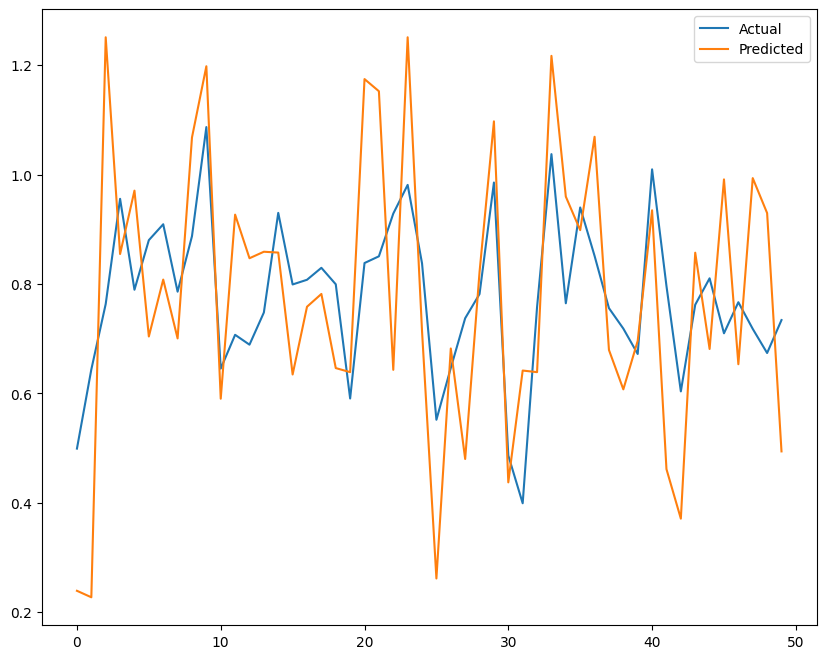

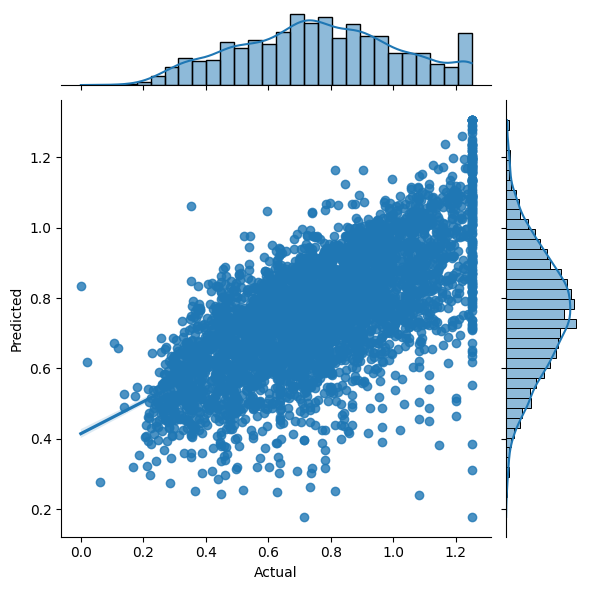

In [132]:
# Assuming y_test and y_pred2 are your actual and predicted values
y_test_1d = np.ravel(y_test)
y_pred2_1d = np.ravel(y_pred2)

test = pd.DataFrame({'Predicted':y_pred2_1d,'Actual':y_test_1d})
fig= plt.figure(figsize=(10,8))
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:50])
plt.legend(['Actual','Predicted'])
sns.jointplot(x='Actual',y='Predicted',data=test,kind='reg',);

In [133]:
mse = mean_squared_error(y_test, y_pred2)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred2)



# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(y_test, y_pred2)

# Calculate Mean Squared Logarithmic Error (MSLE)
msle = mean_squared_log_error(y_test, y_pred2)

# Calculate Explained Variance Score
explained_variance = explained_variance_score(y_test, y_pred2)

# Calculate Adjusted R-squared
n = len(y_test)
p = X_test.shape[1]
adjusted_r_squared = 1 - (1 - r2_2) * (n - 1) / (n - p - 1)

print("Adjusted R-squared:", adjusted_r_squared)

print("Mean Absolute Percentage Error (MAPE):", mape)
print("Mean Squared Logarithmic Error (MSLE):", msle)
print("Explained Variance Score:", explained_variance)


print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)

Adjusted R-squared: 0.45455495597478834
Mean Absolute Percentage Error (MAPE): 910842258420.5087
Mean Squared Logarithmic Error (MSLE): 0.012164602444822892
Explained Variance Score: 0.4547002246781039
Mean Squared Error (MSE): 0.03551324639539018
Mean Absolute Error (MAE): 0.14809760709629213


In [134]:

# Assuming model is your fitted LinearRegression model
slope = model2.coef_[0]
intercept = model2.intercept_

# Convert slope and intercept to float
slope = float(slope)
intercept = float(intercept)

print("Regression Equation: y = {:.2f}x + {:.2f}".format(slope, intercept))


Regression Equation: y = 0.71x + 0.18


<ipython-input-134-ab64495f39f0>:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  slope = float(slope)
<ipython-input-134-ab64495f39f0>:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  intercept = float(intercept)


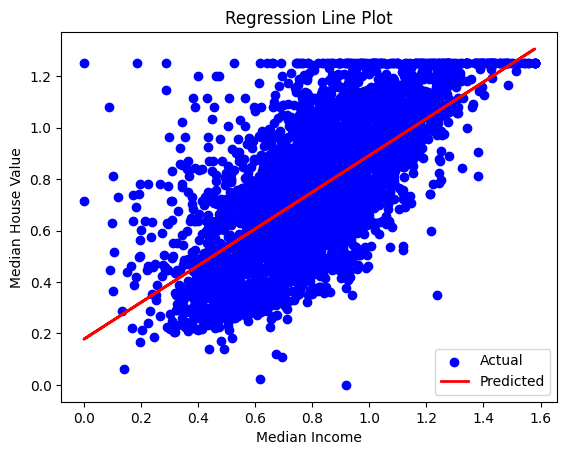

In [135]:


# Plot the data points
plt.scatter(X_test, y_test, color='blue', label='Actual')

# Plot the regression line
plt.plot(X_test, model2.predict(X_test), color='red', linewidth=2, label='Predicted')

# Add labels and title
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.title('Regression Line Plot')
plt.legend()

# Show plot
plt.show()

In [136]:
model = LinearRegression()

# Perform cross-validation with 5 folds
cv_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')

# Convert scores to positive values and calculate mean
mse_scores = -cv_scores  # convert negative MSE to positive
mean_mse = mse_scores.mean()

# Print the cross-validation scores and mean MSE
print("Cross-validation MSE scores:", mse_scores)
print("Mean MSE:", mean_mse)

Cross-validation MSE scores: [0.0417879  0.03808222 0.03044137 0.04069881 0.03459954]
Mean MSE: 0.037121970311500434


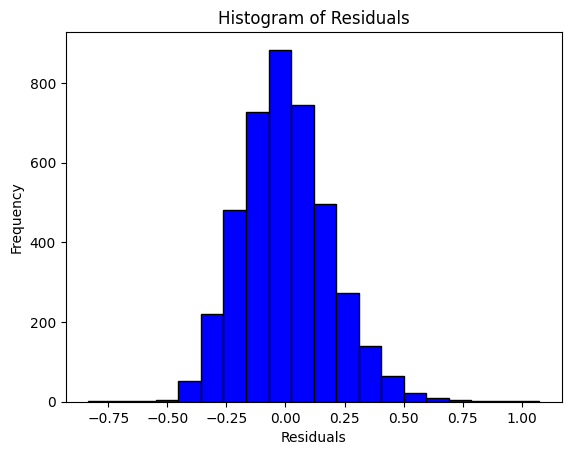

In [137]:
residuals=y_test-y_pred2
# Histogram
plt.hist(residuals, bins=20, color='blue', edgecolor='black')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

# Assuming 'residuals' are the residuals from your regression model




In [138]:
# Calculate the mean of the residuals
residuals_mean = residuals.mean()

# Check if the mean is close to zero
if abs(residuals_mean) < 1e-6:  # Adjust tolerance as needed
    print("Mean of residuals is approximately zero.")
else:
    print("Mean of residuals is not zero. Mean:", residuals_mean)

Mean of residuals is not zero. Mean: 0.0009237808991508819


In [139]:
# Shapiro-Wilk test
sw_test_stat, sw_p_value = stats.shapiro(residuals)
print(f"Shapiro-Wilk test statistic: {sw_test_stat:.4f}")
print(f"p-value: {sw_p_value:.4f}")

Shapiro-Wilk test statistic: 0.9887
p-value: 0.0000


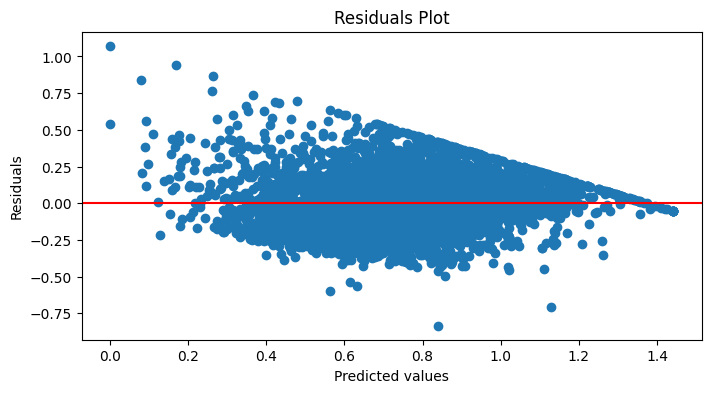

Goldfeld-Quandt test statistic: 0.9658
p-value: 0.7853


In [140]:
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_goldfeldquandt

# Assuming 'X' is your feature matrix and 'y' is your target vector
# Assuming 'model' is your fitted regression model

# Get residuals


# Residuals plot
plt.figure(figsize=(8, 4))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()

# Goldfeld-Quandt Test
gq_test_stat, gq_p_value, _ = het_goldfeldquandt(residuals, X_test)
print(f"Goldfeld-Quandt test statistic: {gq_test_stat:.4f}")
print(f"p-value: {gq_p_value:.4f}")


## CONCLUSION :    

The feature "median_total_income" is the best feature to predict the house prices. Also, after fitting the simple linear regression, if we initialize the fit_intercept value as True then the root mean square error is much less compared to the fit_intercept being False.

We can say that income of an individual matters the most for buying a house in California.